## PRCP-1025-FlightPricePrediction

#### In this project 
- EDA: Learn the complete process of EDA univariate and bivariate analysis 
- Data analysis: Learn to withdraw some insights from the dataset both mathematically and visualize it.
- Data visualization: Visualising the data to get better insight from it.
- Feature engineering: We will also see what kind of stuff we can do in the feature engineering part.
- Model creation 

In [1]:
# Importing libraries 
import numpy as np 
import pandas as pd 
# Visaulize the plot
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns 
#remove warniongs 
import warnings 
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

### Read data set -

In [2]:
df = pd.read_excel('Flight.xlsx')


In [3]:
df

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
...,...,...,...,...,...,...,...,...,...,...,...
10678,Air Asia,9/04/2019,Kolkata,Banglore,CCU → BLR,19:55,22:25,2h 30m,non-stop,No info,4107
10679,Air India,27/04/2019,Kolkata,Banglore,CCU → BLR,20:45,23:20,2h 35m,non-stop,No info,4145
10680,Jet Airways,27/04/2019,Banglore,Delhi,BLR → DEL,08:20,11:20,3h,non-stop,No info,7229
10681,Vistara,01/03/2019,Banglore,New Delhi,BLR → DEL,11:30,14:10,2h 40m,non-stop,No info,12648


## Domain analysis :

In [3]:
df.shape # rows - 10683 # columns 11

(10683, 11)

In [16]:
df.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10683 entries, 0 to 10682
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Airline          10683 non-null  object
 1   Date_of_Journey  10683 non-null  object
 2   Source           10683 non-null  object
 3   Destination      10683 non-null  object
 4   Route            10682 non-null  object
 5   Dep_Time         10683 non-null  object
 6   Arrival_Time     10683 non-null  object
 7   Duration         10683 non-null  object
 8   Total_Stops      10682 non-null  object
 9   Additional_Info  10683 non-null  object
 10  Price            10683 non-null  int64 
dtypes: int64(1), object(10)
memory usage: 918.2+ KB


In [3]:
# To show the all columns 
pd.set_option("display.max_columns", 20)
pd.set_option("display.max_rows", 20000)

In [13]:
df.describe() # only one numeric column so shows only one column value

,Price
count,10683.000000
mean,9087.064121
std,4611.359167
min,1759.000000
25%,5277.000000
50%,8372.000000
75%,12373.000000
max,79512.000000


In [14]:
df.describe(include='all')

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
count,10683,10683,10683,10683,10682,10683,10683,10683,10682,10683,10683.000000
unique,12,44,5,6,128,222,1343,368,5,10,NaN
top,Jet Airways,18/05/2019,Delhi,Cochin,DEL → BOM → COK,18:55,19:00,2h 50m,1 stop,No info,NaN
freq,3849,504,4537,4537,2376,233,423,550,5625,8345,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9087.064121
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4611.359167
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1759.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5277.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8372.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12373.000000


In [15]:
df.describe(include='O').T# categorical columns

,count,unique,top,freq
Airline,10683,12,Jet Airways,3849
Date_of_Journey,10683,44,18/05/2019,504
Source,10683,5,Delhi,4537
Destination,10683,6,Cochin,4537
Route,10682,128,DEL → BOM → COK,2376
Dep_Time,10683,222,18:55,233
Arrival_Time,10683,1343,19:00,423
Duration,10683,368,2h 50m,550
Total_Stops,10682,5,1 stop,5625
Additional_Info,10683,10,No info,8345


In [24]:
df.head(10)

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
0,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,22:20,01:10 22 Mar,2h 50m,non-stop,No info,3897
1,Air India,1/05/2019,Kolkata,Banglore,CCU → IXR → BBI → BLR,05:50,13:15,7h 25m,2 stops,No info,7662
2,Jet Airways,9/06/2019,Delhi,Cochin,DEL → LKO → BOM → COK,09:25,04:25 10 Jun,19h,2 stops,No info,13882
3,IndiGo,12/05/2019,Kolkata,Banglore,CCU → NAG → BLR,18:05,23:30,5h 25m,1 stop,No info,6218
4,IndiGo,01/03/2019,Banglore,New Delhi,BLR → NAG → DEL,16:50,21:35,4h 45m,1 stop,No info,13302
5,SpiceJet,24/06/2019,Kolkata,Banglore,CCU → BLR,09:00,11:25,2h 25m,non-stop,No info,3873
6,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,18:55,10:25 13 Mar,15h 30m,1 stop,In-flight meal not included,11087
7,Jet Airways,01/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:00,05:05 02 Mar,21h 5m,1 stop,No info,22270
8,Jet Airways,12/03/2019,Banglore,New Delhi,BLR → BOM → DEL,08:55,10:25 13 Mar,25h 30m,1 stop,In-flight meal not included,11087
9,Multiple carriers,27/05/2019,Delhi,Cochin,DEL → BOM → COK,11:25,19:15,7h 50m,1 stop,No info,8625


In [26]:
df.describe(include='all').T #T -CHANGES ROWS AND COLUMNS POSITION 

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Airline,10683,12,Jet Airways,3849,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Date_of_Journey,10683,44,18/05/2019,504,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Source,10683,5,Delhi,4537,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Destination,10683,6,Cochin,4537,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Route,10682,128,DEL → BOM → COK,2376,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dep_Time,10683,222,18:55,233,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Arrival_Time,10683,1343,19:00,423,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Duration,10683,368,2h 50m,550,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Total_Stops,10682,5,1 stop,5625,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Additional_Info,10683,10,No info,8345,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
df.dtypes# data types of each column 

Airline            object
Date_of_Journey    object
Source             object
Destination        object
Route              object
Dep_Time           object
Arrival_Time       object
Duration           object
Total_Stops        object
Additional_Info    object
Price               int64
dtype: object

In [34]:
 
''' ALL COLUMNS ARE OBJECT TYPE ONLY TARGET COLUMN  Price IS INT TYPE'''

' ALL COLUMNS ARE OBJECT TYPE ONLY TARGET COLUMN  Price IS INT TYPE'

In [36]:
# value counts of each categorical variables , with thier unique values ,most frequent values .
df.describe(include='O').value_counts

<bound method DataFrame.value_counts of             Airline Date_of_Journey Source Destination            Route  \
count         10683           10683  10683       10683            10682   
unique           12              44      5           6              128   
top     Jet Airways      18/05/2019  Delhi      Cochin  DEL → BOM → COK   
freq           3849             504   4537        4537             2376   

       Dep_Time Arrival_Time Duration Total_Stops Additional_Info  
count     10683        10683    10683       10682           10683  
unique      222         1343      368           5              10  
top       18:55        19:00   2h 50m      1 stop         No info  
freq        233          423      550        5625            8345  >

In [5]:
# check duplicates:
df[df.duplicated()].head()

,Airline,Date_of_Journey,Source,Destination,Route,Dep_Time,Arrival_Time,Duration,Total_Stops,Additional_Info,Price
683,Jet Airways,1/06/2019,Delhi,Cochin,DEL → NAG → BOM → COK,14:35,04:25 02 Jun,13h 50m,2 stops,No info,13376
1061,Air India,21/05/2019,Delhi,Cochin,DEL → GOI → BOM → COK,22:00,19:15 22 May,21h 15m,2 stops,No info,10231
1348,Air India,18/05/2019,Delhi,Cochin,DEL → HYD → BOM → COK,17:15,19:15 19 May,26h,2 stops,No info,12392
1418,Jet Airways,6/06/2019,Delhi,Cochin,DEL → JAI → BOM → COK,05:30,04:25 07 Jun,22h 55m,2 stops,In-flight meal not included,10368
1674,IndiGo,24/03/2019,Banglore,New Delhi,BLR → DEL,18:25,21:20,2h 55m,non-stop,No info,7303


In [5]:
# Here we will be removing those repeated values from the dataset and keeping the in-place attribute to be true 
#so that there will be no changes.
df.drop_duplicates(keep='first',inplace=True)

In [7]:
# Drop duplicates
'''the more rows of values and columns have the same values or are duplicates. 
    Therefore its very important for you to remove duplicates from the dataset to maintain accuracy 
    and to avoid misleading statistics. '''
print( df.shape )
# 10683- 10463 =220 duplicates are removed 

(10463, 11)


In [19]:
# Checking the Additional_info column and having the count of unique type of values
df["Additional_Info"].value_counts()
# this nominal column .but most information is no .info .

No info                         8183
In-flight meal not included     1926
No check-in baggage included     318
1 Long layover                    19
Change airports                    7
Business class                     4
No Info                            3
1 Short layover                    1
Red-eye flight                     1
2 Long layover                     1
Name: Additional_Info, dtype: int64

In [18]:
print(df.describe(include='O').value_counts)

<bound method DataFrame.value_counts of             Airline Date_of_Journey Source Destination            Route  \
count         10463           10463  10463       10463            10462   
unique           12              44      5           6              128   
top     Jet Airways       6/06/2019  Delhi      Cochin  DEL → BOM → COK   
freq           3700             490   4346        4346             2376   

       Dep_Time Arrival_Time Duration Total_Stops Additional_Info  
count     10463        10463    10463       10462           10463  
unique      222         1343      368           5              10  
top       18:55        19:00   2h 50m      1 stop         No info  
freq        233          412      544        5625            8183  >


In [53]:
df.nunique().sort_values(ascending=False)

Price              1870
Arrival_Time       1343
Duration            368
Dep_Time            222
Route               128
Date_of_Journey      44
Airline              12
Additional_Info      10
Destination           6
Source                5
Total_Stops           5
dtype: int64

In [7]:
df.isnull().sum().sort_values(ascending=False) # check Nan /Null values in df datset 

Route              1
Total_Stops        1
Airline            0
Date_of_Journey    0
Source             0
Destination        0
Dep_Time           0
Arrival_Time       0
Duration           0
Additional_Info    0
Price              0
dtype: int64

In [8]:
# Get the percentages of null values of each column 
null_perc = (df.isnull().sum()/df.shape[0]*100).sort_values(ascending=False)
null_perc

Route              0.009557
Total_Stops        0.009557
Airline            0.000000
Date_of_Journey    0.000000
Source             0.000000
Destination        0.000000
Dep_Time           0.000000
Arrival_Time       0.000000
Duration           0.000000
Additional_Info    0.000000
Price              0.000000
dtype: float64

In [10]:
# Dropping NAN values/missing values.

df.dropna(inplace = True) # drop that rows whose very less Nan values.

In [11]:
#Checking the Additional_info column and having the count of unique types of values

In [24]:
df["Additional_Info"].value_counts()

No info                         8182
In-flight meal not included     1926
No check-in baggage included     318
1 Long layover                    19
Change airports                    7
Business class                     4
No Info                            3
1 Short layover                    1
Red-eye flight                     1
2 Long layover                     1
Name: Additional_Info, dtype: int64

In [25]:
df["Additional_Info"].nunique()

10

In [26]:
# Checking the different Airlines
df["Airline"].nunique()

12

In [81]:
df["Route"].unique()

128

In [70]:
 df['Source'].unique()

array(['Banglore', 'Kolkata', 'Delhi', 'Chennai', 'Mumbai'], dtype=object)

In [71]:
 df['Source'].nunique()

5

In [75]:
df['Date_of_Journey'].nunique()

44

In [78]:
df['Source'].unique()

array(['Banglore', 'Kolkata', 'Delhi', 'Chennai', 'Mumbai'], dtype=object)

In [72]:
df['Destination'].unique()

array(['New Delhi', 'Banglore', 'Cochin', 'Kolkata', 'Delhi', 'Hyderabad'],
      dtype=object)

In [83]:
df.Total_Stops.unique()

array(['non-stop', '2 stops', '1 stop', '3 stops', '4 stops'],
      dtype=object)

In [86]:
df.describe()

,Price
count,10462.000000
mean,9026.790289
std,4624.849541
min,1759.000000
25%,5224.000000
50%,8266.000000
75%,12344.750000
max,79512.000000


In [68]:
df.columns

Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info', 'Price'],
      dtype='object')

In [87]:
df.shape

(10462, 11)

# 2. EXPLORATORY DATA ANALYSIS:
- UNIVARIATE ANALYSIS -Categorical variables can be visualized using a Count plot, Bar Chart, Pie Plot, etc.
Numerical Variables can be visualized using Histogram, Box Plot, Density Plot,
- II. BIVARIATE ANALYSIS:
Bivariate Analysis helps to understand how variables are related to each other and the relationship between dependent and independent variables present in the dataset.
For Numerical variables, Pair plots and Scatter plots are widely been used to do Bivariate Analysis.
-A Stacked bar chart can be used for categorical variables if the output variable is a classifier. Bar plots can be used if the output variable is continuous

- III. Multivariate Analysis
A heat map is widely been used for Multivariate Analysis
-Heat Map gives the correlation between the variables, whether it has a positive or negative correlation.

#### Univariate  analysis:


In [12]:
## identifying numeric variables
numeric = df.select_dtypes(include=['float64','int64'])
numeric = numeric.columns

In [13]:
print(numeric, len(numeric))

Index(['Price'], dtype='object') 1


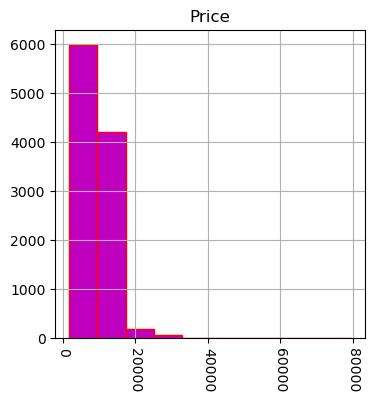

In [29]:
# plot numeric column :
df.hist(figsize=(4,4), xrot=-90, bins=10, color = "m",ec="red") ## Display the labels rotated by 45 degress
plt.show()

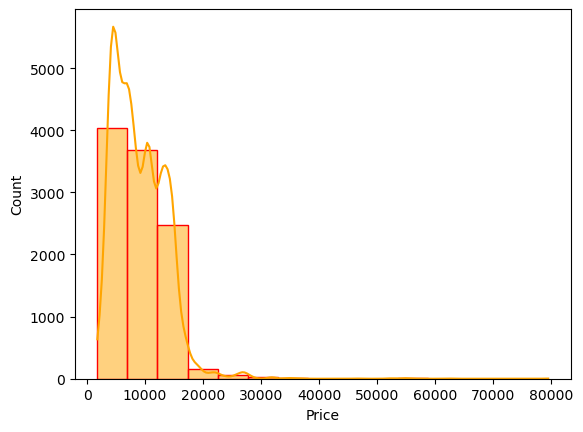

In [30]:
sns.histplot(df['Price'],bins=15,kde=True,color='orange', edgecolor='red' )
plt.show()
#not normaly distributs 

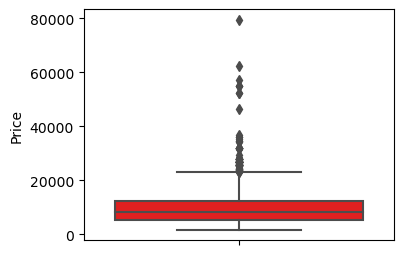

In [36]:
plt.figure(figsize=(4,3 ))

sns.boxplot(y=df['Price'],orient="h",color="red")

plt.show()

- Price column is totaly skewd at right side 
- outliers are there  after 2500 thousand means high amount of ticket charges .

In [14]:
##identifying categorical variables
categorical = df.select_dtypes(include=['object'])
categorical = categorical.columns
print("categorical columns :", categorical,"length is ",len(categorical))

categorical columns : Index(['Airline', 'Date_of_Journey', 'Source', 'Destination', 'Route',
       'Dep_Time', 'Arrival_Time', 'Duration', 'Total_Stops',
       'Additional_Info'],
      dtype='object') length is  10


In [ ]:
# Univariate analysis of categorical columns :

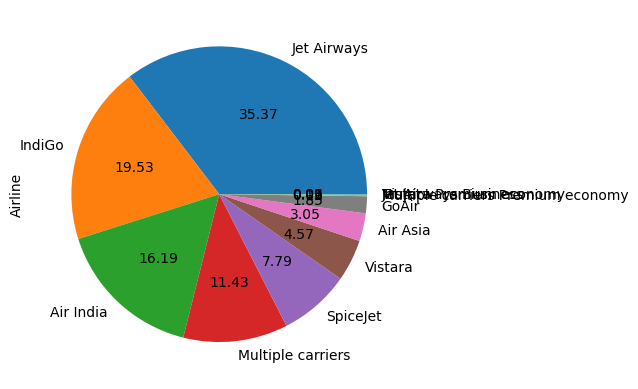

In [107]:
# pie chart for categorical variable .
# Airline
df["Airline"].value_counts().plot(kind='pie',autopct='%.2f') 
plt.show()

-Airline column insights:
- most of flights are from  jetairways 35.37%, Indigo-19.53 ,air india -16.19%

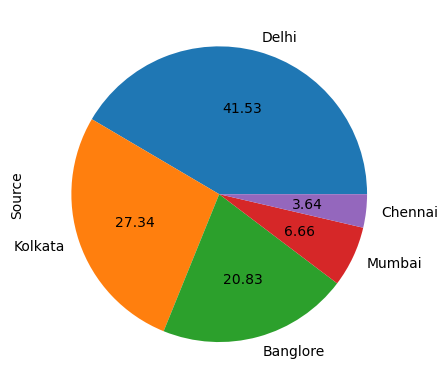

In [108]:

df["Source"].value_counts().plot(kind='pie',autopct='%.2f') 
plt.show()

- Source column insight - most flights source from Delhi=41.53% , then kolkata then banglore ,mumbai then  chennai=5 sources


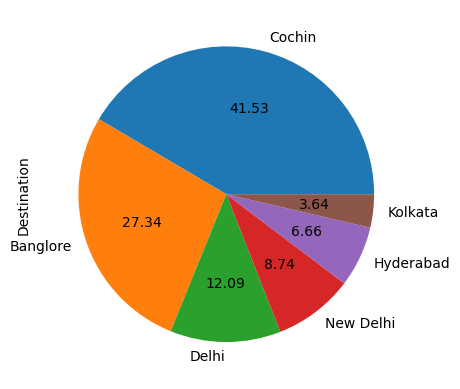

In [110]:

df['Destination'].value_counts().plot(kind='pie',autopct='%.2f') 
plt.show()


'Destination' column insights are -cochin destination airport 41.53 %
- means at cochin airport most flights are reached . 
- then BANGLORE 27.34 THEN DELHI 12.09%
- 6 DESTINATION AIRPLORT ARE THERE.

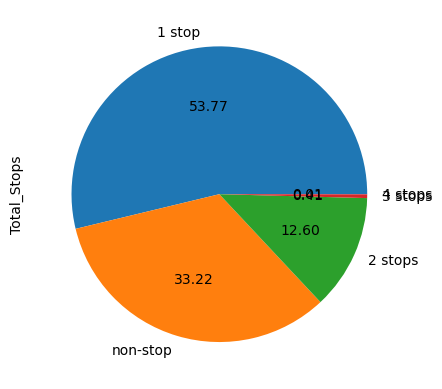

In [112]:

df['Total_Stops'].value_counts().plot(kind='pie',autopct='%.2f') 
plt.show()

- how many places flights will stop there for the flight in the whole journey.: MAINY 1 STOP 53.77% THEN NON STOP 
    - 5 STOPS ONLY 0.01 % FLIGHT IS STOP 

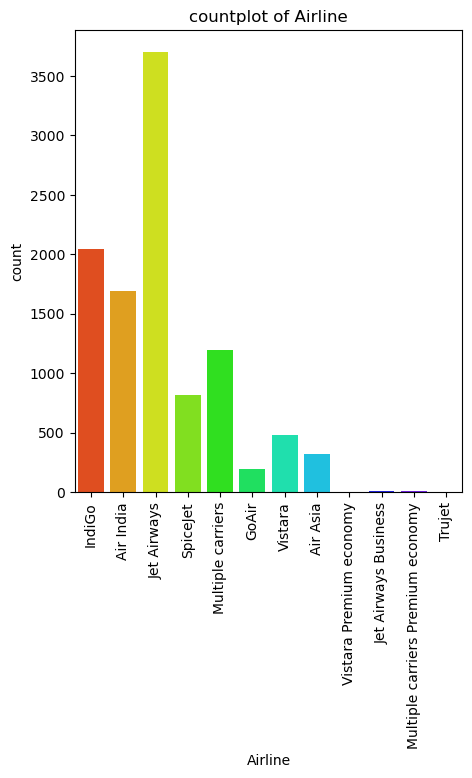

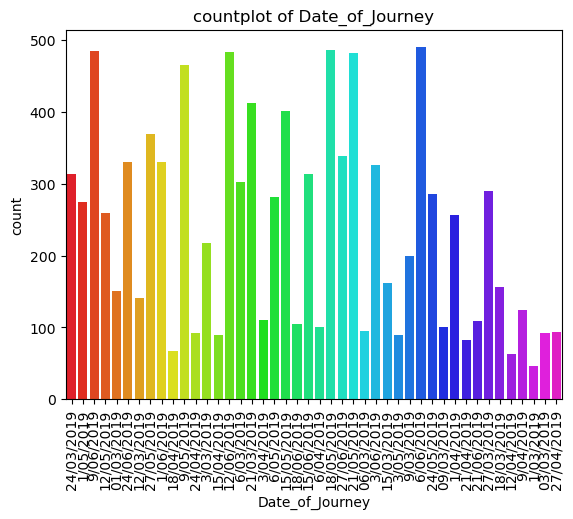

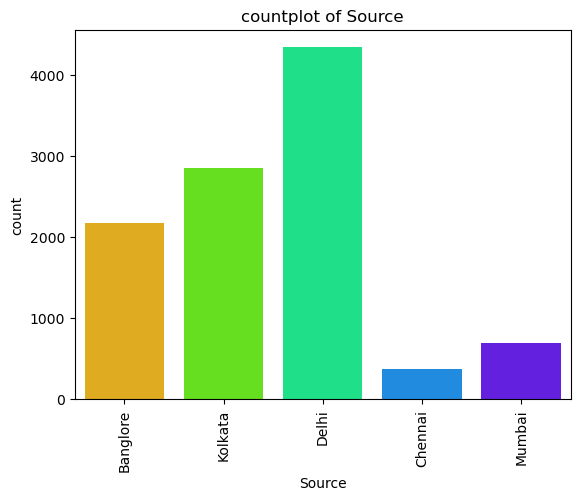

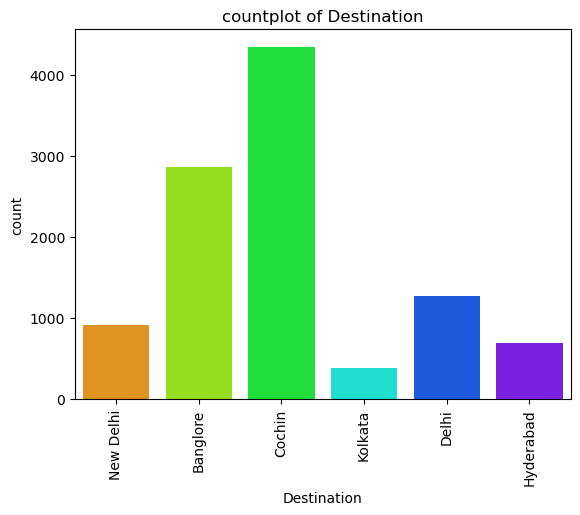

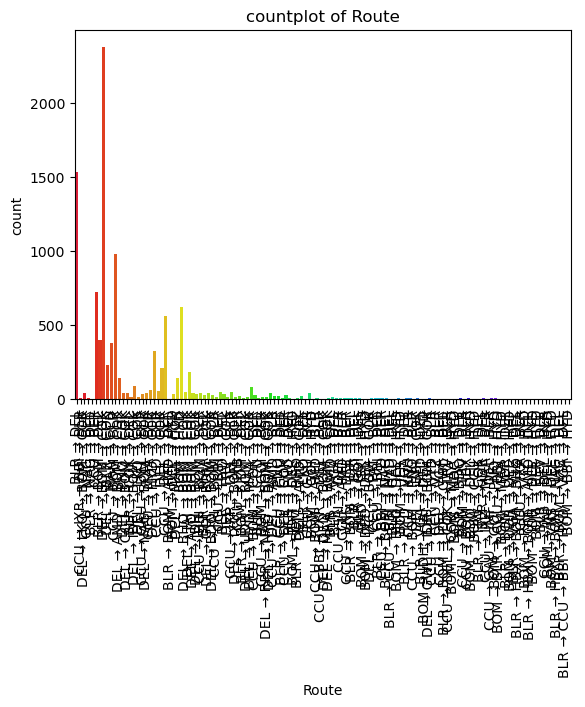

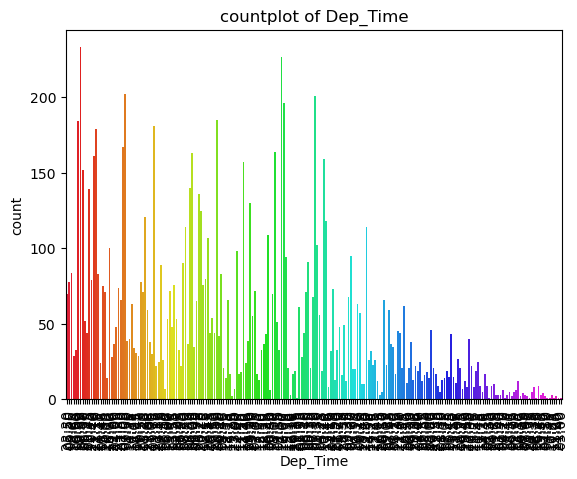

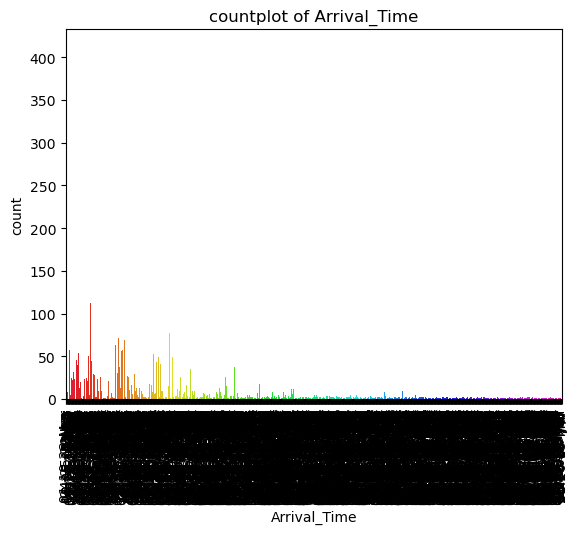

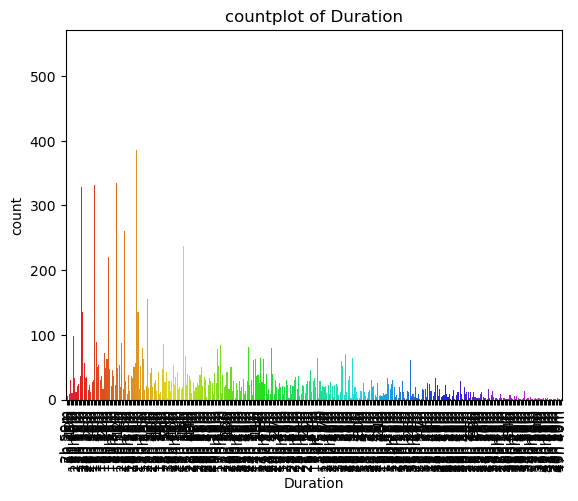

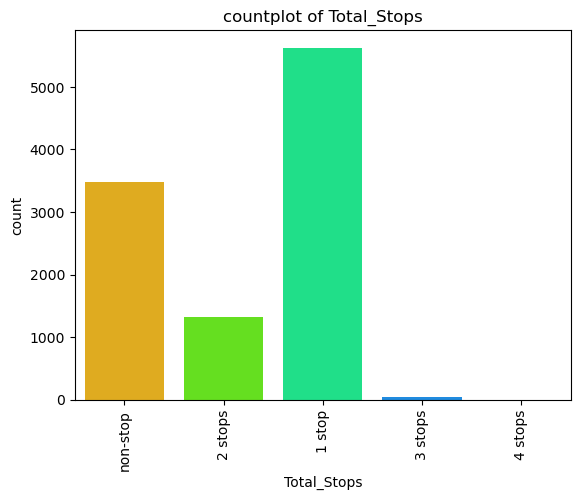

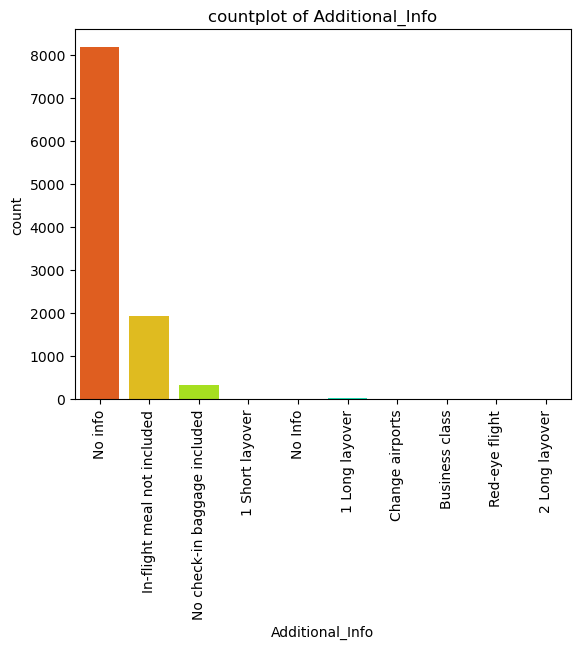

In [116]:
# using for loop you can plot countplot : of all categorical columns : 
fig = plt.figure(figsize=(5,6))

for col in categorical:
    
    sns.countplot(x=col, data=df, palette = "gist_rainbow")
    plt.xticks(rotation=90)
    plt.title(f"countplot of {col}")
    
    plt.show()
fig.tight_layout(pad=0.2)

additional info: column insights 
- no info - most value counts 8000
- in flight meal not included - these flights are 2000 , 
- no checking bagage include flights may be mor than 2 only. 
- this column not relevant to sale price in future we can drop it. 

#### FIRST DATETIME CONVERSION OF OBJECT COLUMNS

In [15]:
df.describe(include='O').T

,count,unique,top,freq
Airline,10462,12,Jet Airways,3700
Date_of_Journey,10462,44,6/06/2019,490
Source,10462,5,Delhi,4345
Destination,10462,6,Cochin,4345
Route,10462,128,DEL → BOM → COK,2376
Dep_Time,10462,222,18:55,233
Arrival_Time,10462,1343,19:00,412
Duration,10462,368,2h 50m,544
Total_Stops,10462,5,1 stop,5625
Additional_Info,10462,10,No info,8182


In [16]:
# Handle Date_of_Journey column it contain only 2019 year data
# traveling date 
df["Journey_day"] = pd.to_datetime(df.Date_of_Journey, format="%d/%m/%Y").dt.day # convert into day in numerical -day 

df["Journey_month"] = pd.to_datetime(df["Date_of_Journey"], format = "%d/%m/%Y").dt.month # convert into month format 

In [ ]:
# we have converted Date_of_Journey column into integers, Now we can drop as it is of no use.

df.drop(["Date_of_Journey"], axis = 1, inplace = True) # inplace true means permanetly deleted

In [23]:
# Dep_Time:  Departure time is  the  time when the plane leaves the gate of the airport.
# Similar to Date_of_Journey we can extract values from Dep_Time

# Extracting Hours
df["Dep_hour"] = pd.to_datetime(df["Dep_Time"]).dt.hour # dep time into hour 

# Extracting Minutes
df["Dep_min"] = pd.to_datetime(df["Dep_Time"]).dt.minute # dep time into minutes

# Now we can drop Dep_Time as it is of no use
df.drop(["Dep_Time"], axis = 1, inplace = True)

KeyError: 'Dep_Time'

In [19]:
# Arrival time - is when the passenger will reach his/her destination.
# Similar above  we can extract values from Arrival_Time

# Extracting Hours
df["Arrival_hour"] = pd.to_datetime(df.Arrival_Time).dt.hour


# Extracting Minutes
df["Arrival_min"] = pd.to_datetime(df.Arrival_Time).dt.minute

# Now we can drop Arrival_Time as it is of no use
df.drop(["Arrival_Time"], axis = 1, inplace = True)

In [20]:
# Handle Duration column -Duration is the whole period that a flight will take to complete its journey 
# from source to destination.
# It is the differnce betwwen Departure Time and Arrival time
# this column contains hour and m string so first extract them 
# Using regular expressions to extract hours and minutes
df['Duration_hrs'] = df['Duration'].str.extract(r'(\d+)h').astype(float).fillna(0) # extract h ,replace nan into 0 value
df['Duration_mins'] = df['Duration'].str.extract(r'(\d+)m').astype(float).fillna(0) # extract m, replace nan into 0 value
 


In [25]:
df['Duration_hrs'] = df['Duration_hrs'].astype(int)
df['Duration_mins'] = df['Duration_mins'].astype(int)

df.drop(['Duration'], axis = 1, inplace = True)

KeyError: "['Duration'] not found in axis"

In [26]:
df.shape # 15 columns are created 

(10462, 15)

### BIVARIATE Analysis:
- Need to find out more about the relationship between all these features with one another.
    - CATEGORICAL VS NUMERICAL : boxplot , barplot, stripplot, distplot 
   - CATEGORICAL VS CATEFGORICAL - USE count plot, barplot
   - Numerical vs numerical: scatterplot  correalation map 
   - heatmap for multivariate analysis
   - pairplot - multivariate 

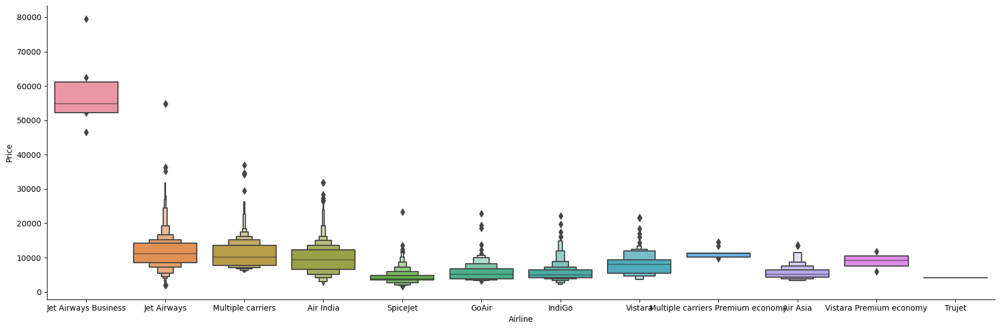

In [74]:
# categorical Airline vs numerical Targe column Price :
sns.catplot(y = "Price", x = "Airline", data = df.sort_values("Price", ascending = False), kind="boxen", height = 6, aspect = 3)
plt.show()

- Insight of Airline vs Price:
    -  From graph we can see that 'Jet Airways Business' have the highest Price.more than 5000 
    - Apart from the first Airline almost all are having similar median ,truejet no value 

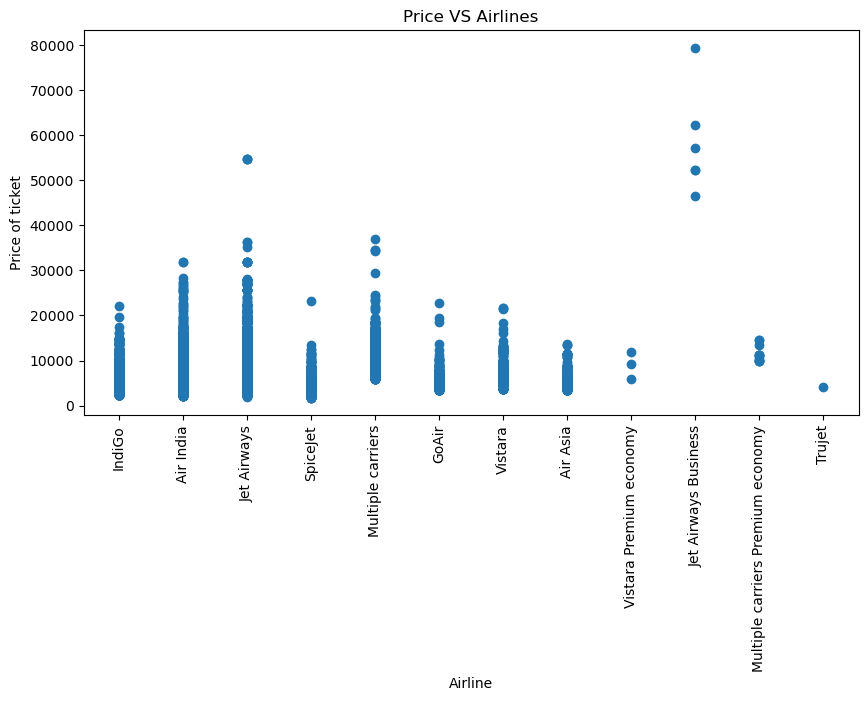

In [116]:
# Plotting flight Price VS Airlines

plt.figure(figsize = (10,5))
plt.title('Price VS Airlines')
plt.scatter(df['Airline'], df['Price'])

plt.xlabel('Airline')
plt.ylabel('Price of ticket')
plt.xticks(rotation = 90)
plt.show()

- Airline vs Price : insgihts  
    - Jet airways buisness class almost high price range than ohters 
    - Truejet very less price of ticket -less than 1000 rs

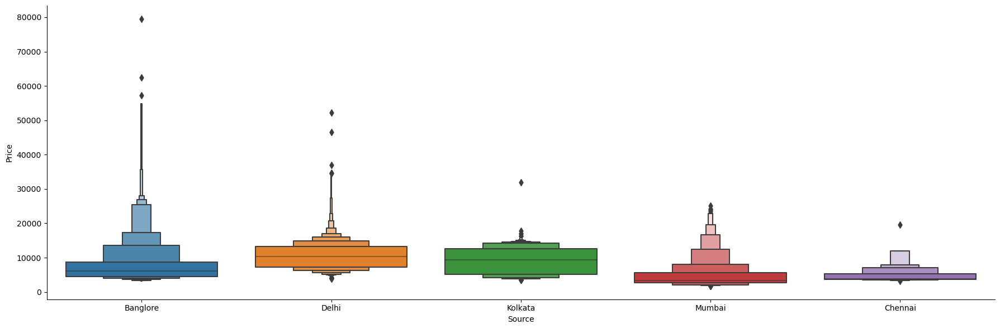

In [79]:
# Source cat vs num price: 
sns.catplot(y = "Price", x = "Source", data = df.sort_values("Price", ascending = False), kind="boxen", height = 6, aspect = 3)
plt.show()


 - insight:
    - Banglore has the most outliers and Mumbai ,chennai  has the least.
    - Banglore flight most price than delhi 

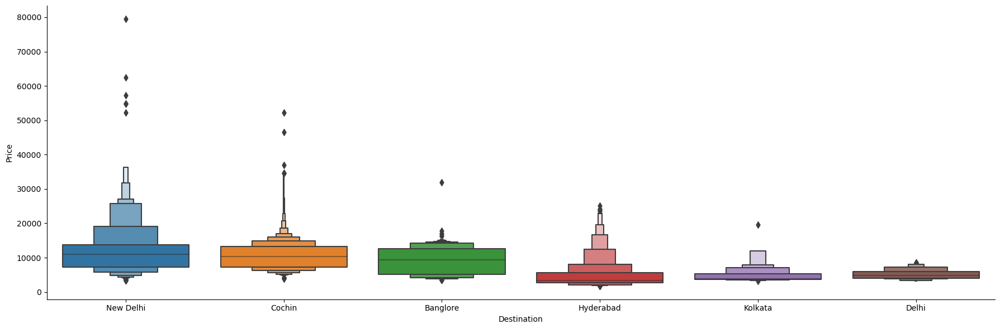

In [80]:
# Destination vs Price :
sns.catplot(y = "Price", x = "Destination", data = df.sort_values("Price", ascending = False), kind="boxen", height = 6, aspect = 3)
plt.show()


- insight  Destination vs price 
 - New Delhi has the most outliers and Kolkata has the least.
    - Source column  there is no New Delhi 
    - Delhi zero outliers 

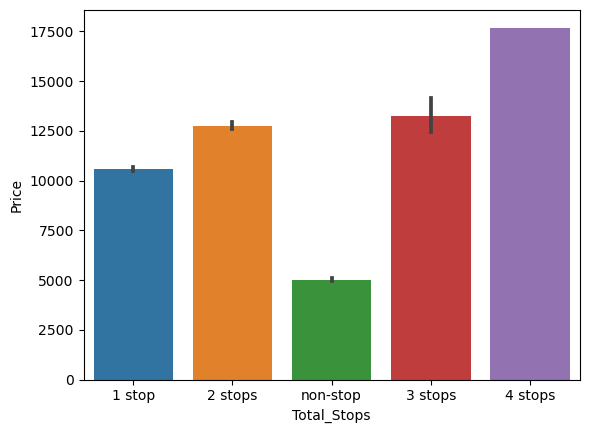

In [83]:
# Destination vs Price :
sns.barplot(y = "Price", x = "Total_Stops", data = df.sort_values("Price", ascending = False))
plt.show()

- Insight :Toatal stop vs price 
     - 4 stop flight is more price 
     - no n stop fligh very less price 

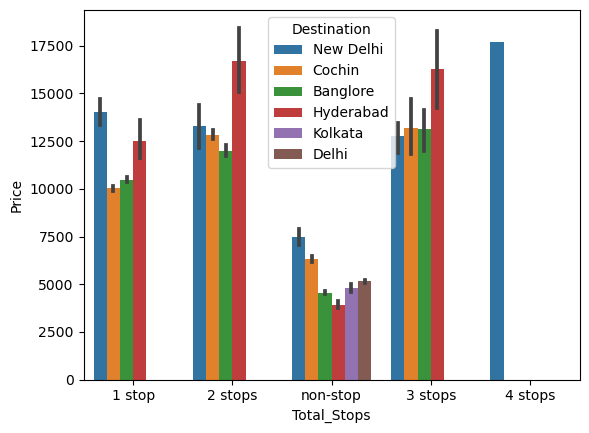

In [85]:
sns.barplot(y = "Price", x = "Total_Stops", data = df.sort_values("Price", ascending = False),hue='Destination')
plt.show()
# HYDRABAD has more price range - 
# 1 STOP ,4 stop - New delhi high price range 
# 4 stop only :New delhi flight is a destination airport 

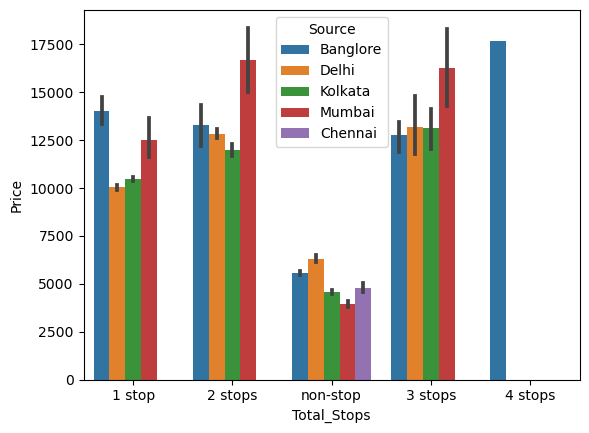

In [86]:
sns.barplot(y = "Price", x = "Total_Stops", data = df.sort_values("Price", ascending = False),hue='Source')
plt.show()



- insight price and totalstop  with hue sourcxe flights 
  - 4 STOP source flight only Banglore  to destination new delhi  has more price range  than other ,has 4 stops
    - source Mubai flight also high range price ,,it takes 1 stop , 2 stops ,3 stops 

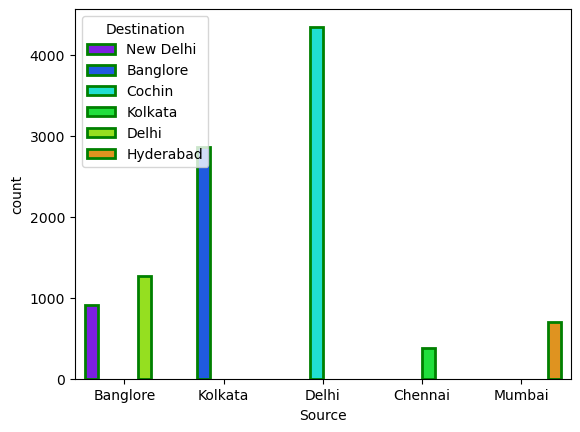

In [100]:
# Sorce categorical feature vs Destination categorical features 
sns.countplot(x="Source",hue='Destination',data=df, linewidth=2, edgecolor='green',palette = "gist_rainbow_r")
plt.show()

- sorce vs destination insight
     - from source delhi to cochin destination  are most flights are going
    -  After from kolkata source to Banglore most flights are gone.
    - from chennai to kolkata very less flights counts.
    -  from Mubai to hydrabad are less flights.
    

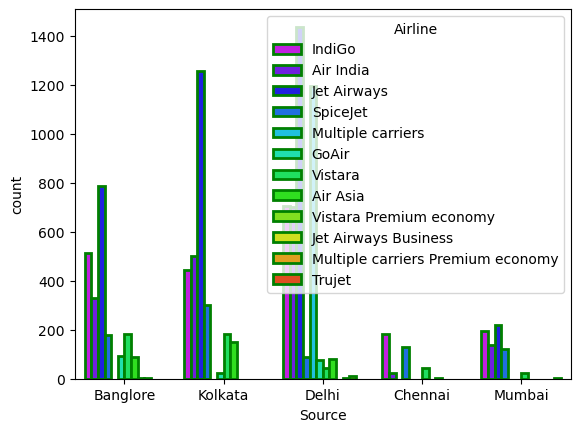

In [101]:
sns.countplot(x="Source",hue='Airline',data=df, linewidth=2, edgecolor='green',palette = "gist_rainbow_r")
plt.show()

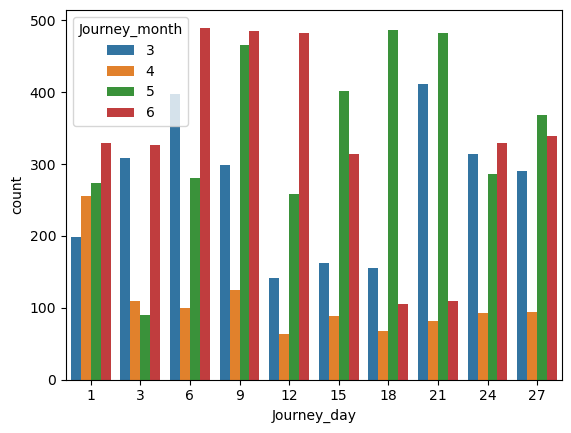

In [121]:
sns.countplot(x = 'Journey_day', data = df, hue="Journey_month")
plt.show()

- Insights of x = 'Journey_day', hue="Journey_month"
    - 5th and 6 month most flights are gone.
    - 3rd =march also more flights also going - date- 6th march ,21 st march 
    - 6th june ,9 th june, 12 th june most flights are gone.
    - 9th may ,21 st may ,18 th may most flights are gone
    -

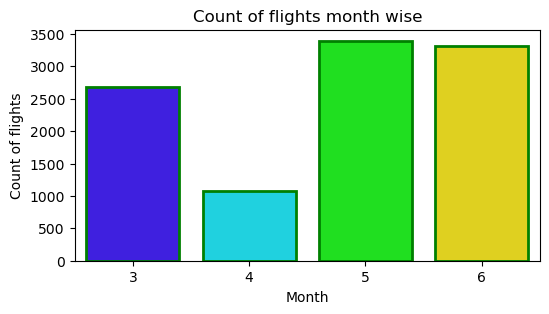

In [103]:
# We have to know in which journey_month most flights are gone .
plt.figure(figsize = (6, 3))
sns.countplot(x="Journey_month",data=df, linewidth=2, edgecolor='green',palette = "gist_rainbow_r")


plt.title('Count of flights month wise')
plt.xlabel('Month')
plt.ylabel('Count of flights')
plt.show()

 - journey in a month vs several flights and got to see that May(5th)  then june (6th)has the most number of flights.

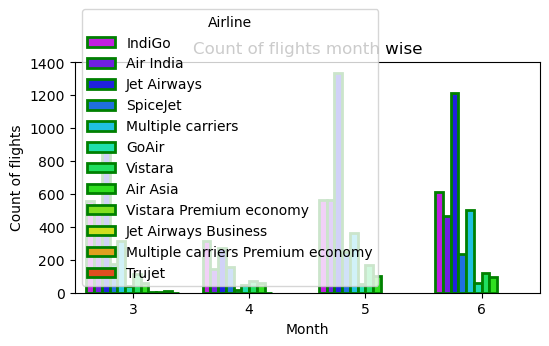

In [123]:
plt.figure(figsize = (6, 3))
sns.countplot(x="Journey_month",hue='Airline',data=df, linewidth=2, edgecolor='green',palette = "gist_rainbow_r") 


plt.title('Count of flights month wise')
plt.xlabel('Month')
plt.ylabel('Count of flights')
plt.show()

- Amost may month jetairways flights are more counts

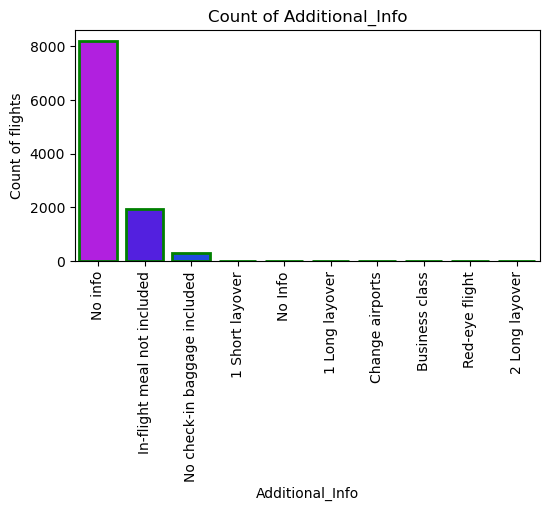

In [108]:
# Additional_Info:
plt.figure(figsize = (6, 3))
sns.countplot(x="Additional_Info",data=df, linewidth=2, edgecolor='green',palette = "gist_rainbow_r")
plt.xticks(rotation=90)
plt.title('Count of Additional_Info')
plt.xlabel('Additional_Info')
plt.ylabel('Count of flights')
plt.show()

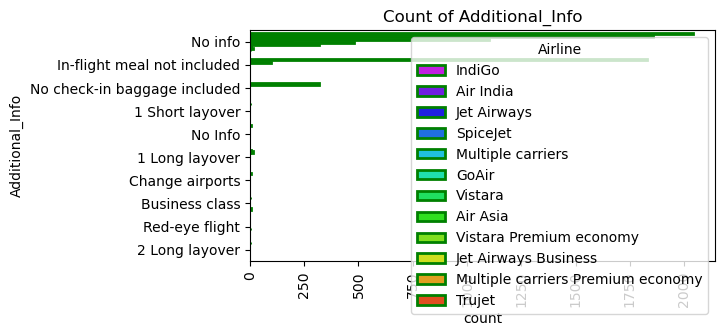

In [111]:
plt.figure(figsize = (6, 3))
sns.countplot(y="Additional_Info",hue="Airline",data=df, linewidth=2, edgecolor='green',palette = "gist_rainbow_r") # y= horizonatly display
plt.xticks(rotation=90)
plt.title('Count of Additional_Info')

plt.show()

- Only Air asia fligh gives addition info . 
- no any other flight give this info - all flight shhows no info 

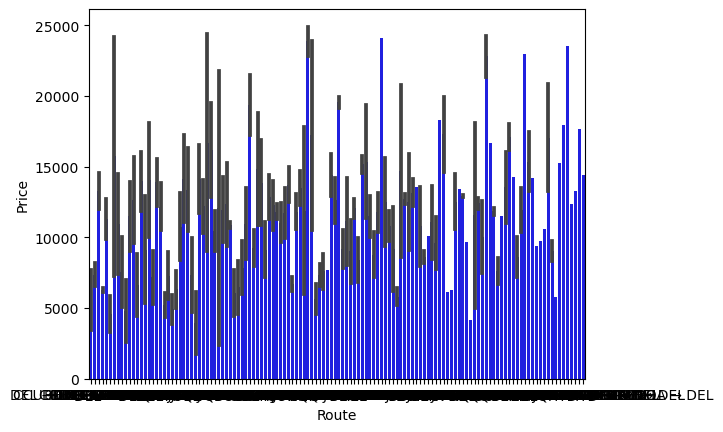

In [140]:
# Route column 
sns.barplot(x='Route',y='Price', data=df, color='blue', ci = "sd")
plt.show()

In [78]:
df.T

,0,1,2,3,4,5,6,7,8,9,...,10671,10674,10675,10676,10677,10678,10679,10680,10681,10682
Airline,IndiGo,Air India,Jet Airways,IndiGo,IndiGo,SpiceJet,Jet Airways,Jet Airways,Jet Airways,Multiple carriers,...,Air India,Jet Airways,Air India,Multiple carriers,SpiceJet,Air Asia,Air India,Jet Airways,Vistara,Air India
Source,Banglore,Kolkata,Delhi,Kolkata,Banglore,Kolkata,Banglore,Banglore,Banglore,Delhi,...,Mumbai,Banglore,Mumbai,Delhi,Banglore,Kolkata,Kolkata,Banglore,Banglore,Delhi
Destination,New Delhi,Banglore,Cochin,Banglore,New Delhi,Banglore,New Delhi,New Delhi,New Delhi,Cochin,...,Hyderabad,New Delhi,Hyderabad,Cochin,Delhi,Banglore,Banglore,Delhi,New Delhi,Cochin
Route,BLR → DEL,CCU → IXR → BBI → BLR,DEL → LKO → BOM → COK,CCU → NAG → BLR,BLR → NAG → DEL,CCU → BLR,BLR → BOM → DEL,BLR → BOM → DEL,BLR → BOM → DEL,DEL → BOM → COK,...,BOM → HYD,BLR → BOM → DEL,BOM → HYD,DEL → BOM → COK,BLR → DEL,CCU → BLR,CCU → BLR,BLR → DEL,BLR → DEL,DEL → GOI → BOM → COK
Total_Stops,non-stop,2 stops,2 stops,1 stop,1 stop,non-stop,1 stop,1 stop,1 stop,1 stop,...,non-stop,1 stop,non-stop,1 stop,non-stop,non-stop,non-stop,non-stop,non-stop,2 stops
Additional_Info,No info,No info,No info,No info,No info,No info,In-flight meal not included,No info,In-flight meal not included,No info,...,No info,In-flight meal not included,No info,No info,No check-in baggage included,No info,No info,No info,No info,No info
Price,3897,7662,13882,6218,13302,3873,11087,22270,11087,8625,...,3100,11087,3100,9794,3257,4107,4145,7229,12648,11753
Journey_day,24,1,9,12,1,24,12,1,12,27,...,6,12,9,1,21,9,27,27,1,9
Journey_month,3,5,6,5,3,6,3,3,3,5,...,6,3,6,5,5,4,4,4,3,5
Dep_hour,22,5,9,18,16,9,18,8,8,11,...,21,20,6,10,5,19,20,8,11,10


### III. Multivariate Analysis : heatmap 

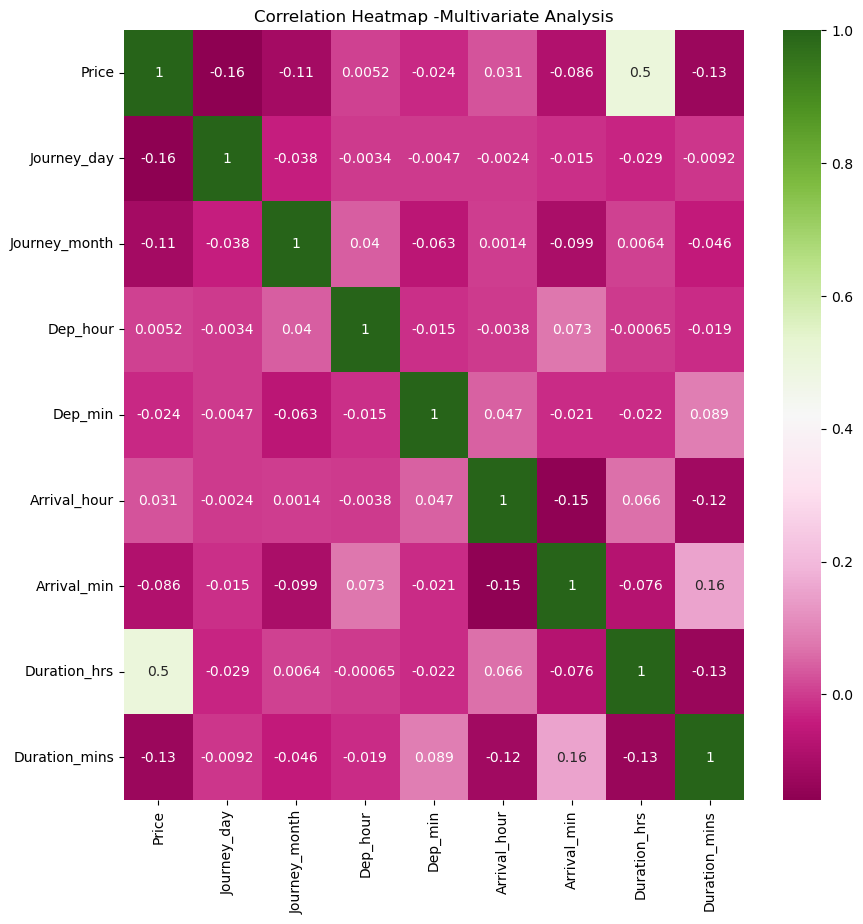

In [118]:
# Create correlation matrix from train data excluding `SalePrice`
corr_mat = df.corr() # all columns except Sale price column 
plt.figure(figsize=(10, 10))
sns.heatmap(corr_mat,
            annot=True,
            cmap="PiYG"
           )

title = plt.title('Correlation Heatmap -Multivariate Analysis')

In [20]:
# above insgiht price affecting mostly for duaration hour column

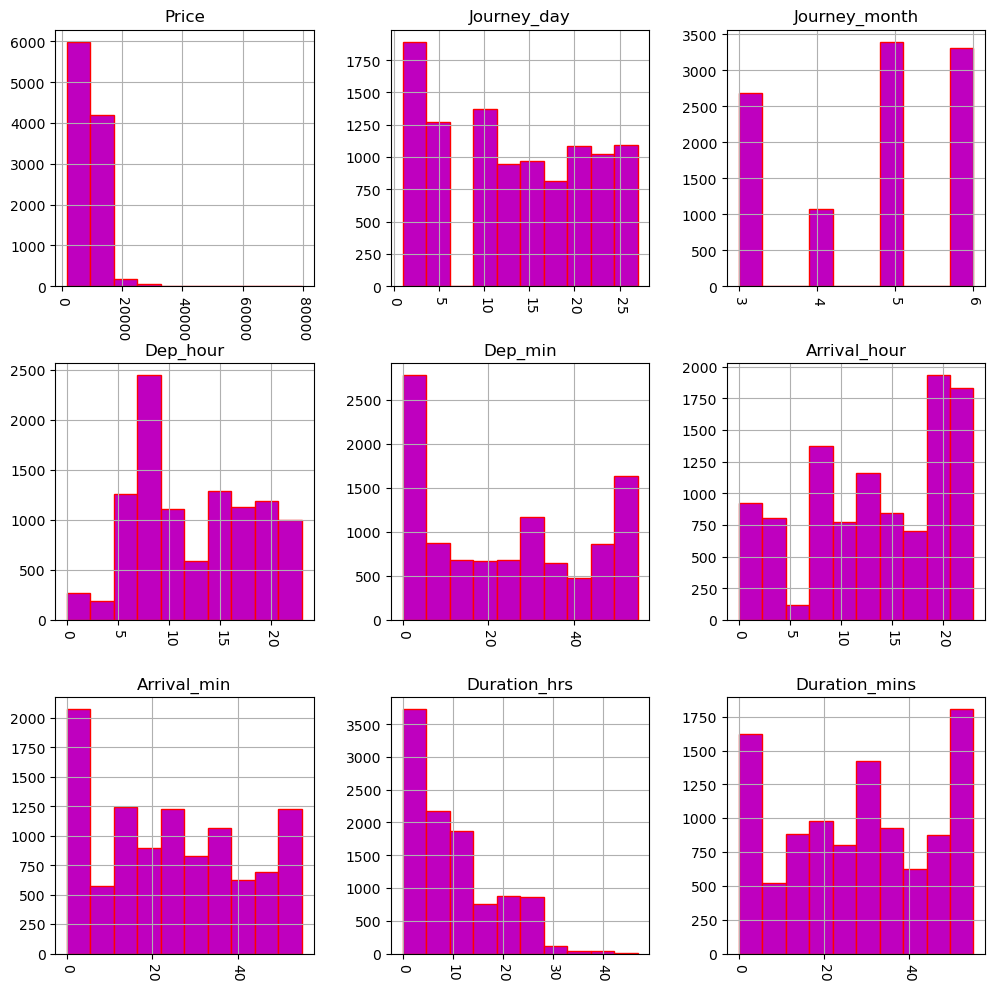

In [25]:
# DISTRIBUTIUTION OF NUMERICAL FEATURES : Numerical columns plot:
df.hist(figsize=(12,12), xrot=-90, bins=10, color = "m",ec="red") ## Display the labels rotated by 45 degress
plt.show()

-  above numerical columns not normaly distributed
 -  Price column right skew
   

In [36]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,10462.0,9026.790289,4624.849541,1759.0,5224.0,8266.0,12344.75,79512.0
Journey_day,10462.0,13.463200,8.467493,1.0,6.0,12.0,21.00,27.0
Journey_month,10462.0,4.701491,1.163802,3.0,3.0,5.0,6.00,6.0
Dep_hour,10462.0,12.478494,5.727227,0.0,8.0,11.0,18.00,23.0
Dep_min,10462.0,24.404989,18.815719,0.0,5.0,25.0,40.00,55.0
Arrival_hour,10462.0,13.387689,6.855547,0.0,8.0,14.0,19.00,23.0
Arrival_min,10462.0,24.719939,16.570450,0.0,10.0,25.0,35.00,55.0
Duration_hrs,10462.0,10.026190,8.378023,0.0,2.0,8.0,15.00,47.0
Duration_mins,10462.0,28.210189,16.879185,0.0,15.0,30.0,45.00,55.0


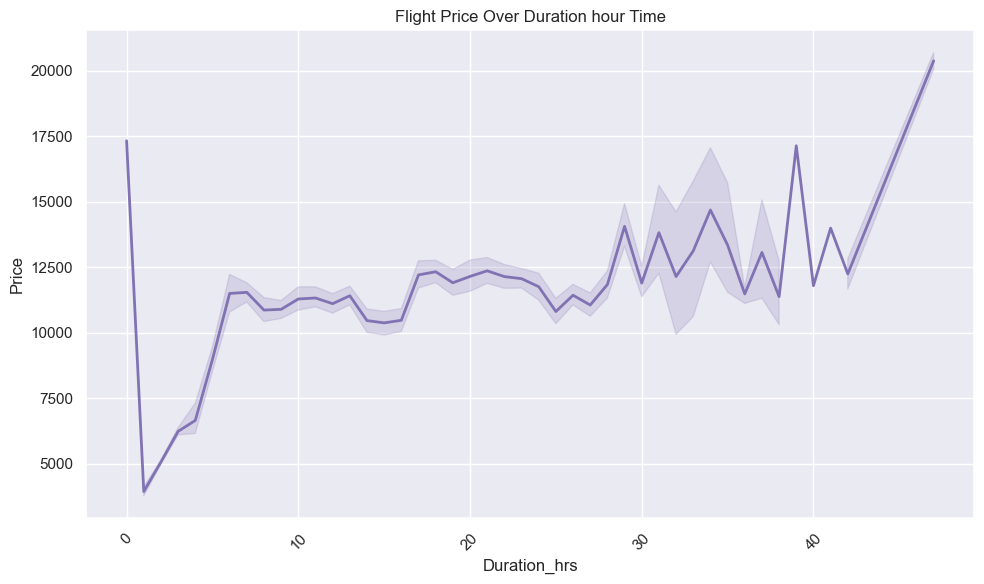

In [41]:
# line plot date ,month or duaration plots :
fig = plt.subplots(figsize=(10, 6))
sns.lineplot(x='Duration_hrs', y='Price', data=df, linestyle='-', color='m',lw=2)
 
plt.xlabel('Duration_hrs')
plt.ylabel('Price')
plt.title('Flight Price Over Duration hour Time')
plt.grid(True)  

plt.xticks(rotation=45) # # Rotate the x-axis labels for better readability (optional, adjust as needed)

plt.tight_layout()  # Adjust the layout for better spacing (optional)

plt.show()

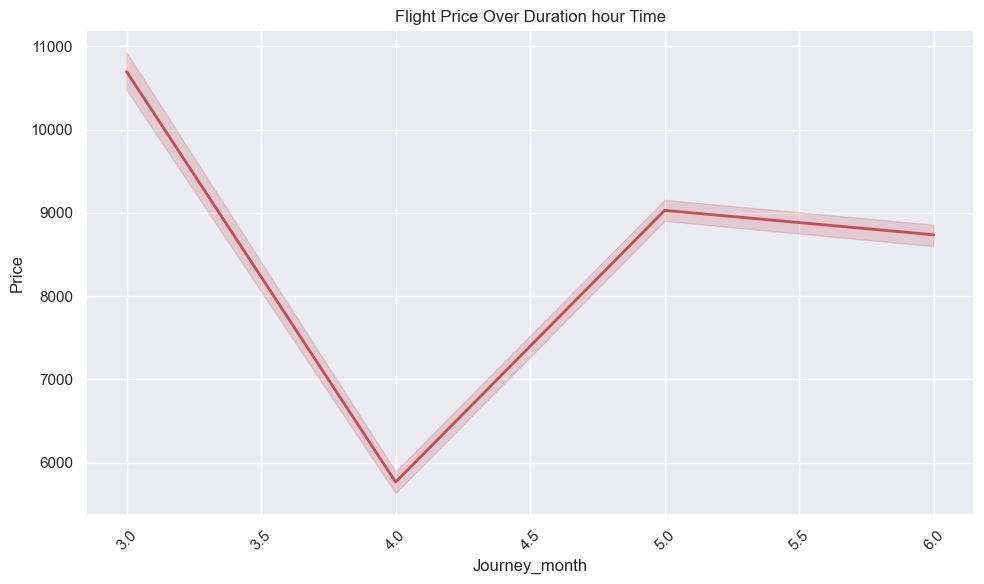

In [43]:
# line plot date ,month or duaration plots :
fig = plt.subplots(figsize=(10, 6))
sns.lineplot(x='Journey_month', y='Price', data=df, linestyle='-', color='r',lw=2)
 
plt.xlabel('Journey_month')
plt.ylabel('Price')
plt.title('Flight Price Over Duration hour Time')
plt.grid(True)  

plt.xticks(rotation=45) # # Rotate the x-axis labels for better readability (optional, adjust as needed)

plt.tight_layout()  # Adjust the layout for better spacing (optional)

plt.show()

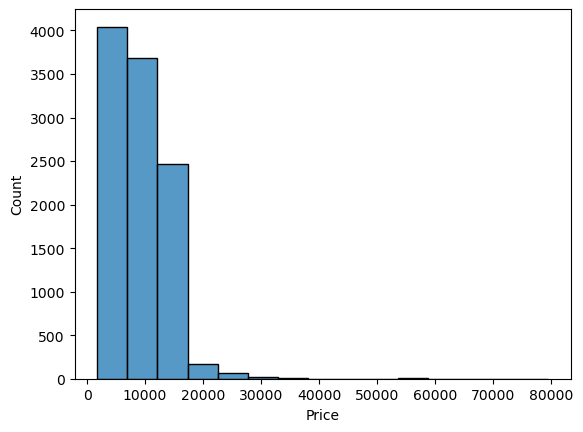

In [127]:
sns.histplot(df["Price"],bins=15)
plt.show()
# most of flight tiket price- 10000 to 15000 k
# more than 20 k 30 k flights are very less. 

# 3. Data Preprocessing :
- Already missing value handle - delete the Nan rows
- Handling Outliers - Mostly Jetairways has most outliers - in price for further jet airways flight tiket clacul,ation its needed no drop any outliers 
- Handiong irrealvant ,not important columns - we can drop it if no use .
- Handling Categorical data - Categorical data into numerical form 
- Handling duplicates after encoding 
- Converting all data types into one type after encoding .
- We can convert all numerical columns into normally distributes or do scaling 

### Handling irrealvant ,not important columns - 

In [128]:
df.Additional_Info.describe()

count       10462
unique         10
top       No info
freq         8182
Name: Additional_Info, dtype: object

In [27]:
 #Additional_Info contains almost  more 80% = no_info= most constant value 
# Route and Total_Stops are related to each other -????

df.drop(["Additional_Info"], axis = 1, inplace = True)

df.drop(["Route"], axis = 1, inplace = True)
# as per domain knowlege route column not affecting price ,already we know source ,destinations and how many stops 

In [29]:
df.shape # 13 columns are created

(10462, 13)

### Detect Outliers : 


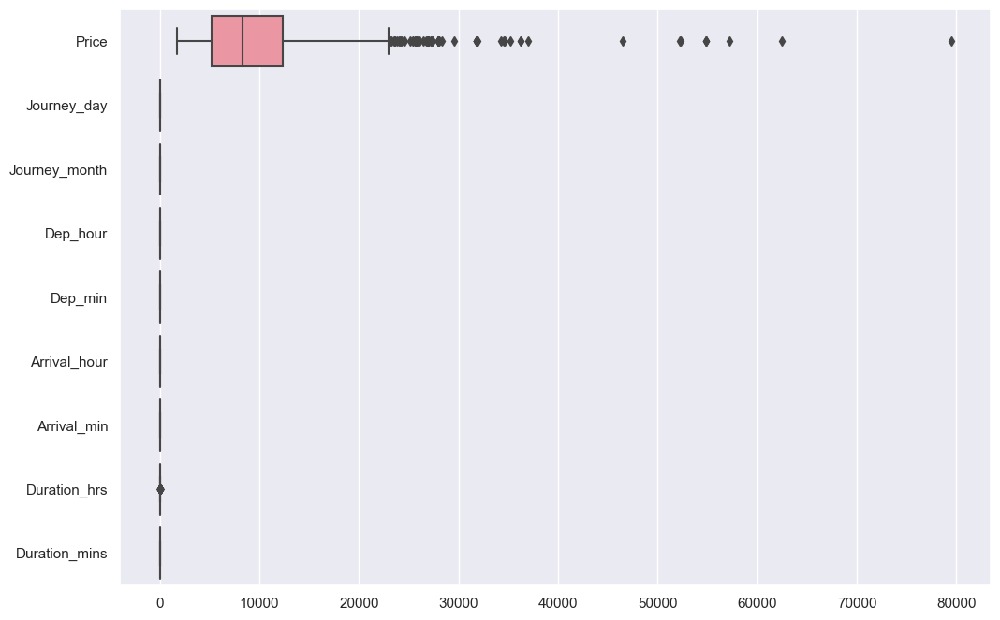

In [24]:
plt.figure(figsize=(12, 8))
sns.set_theme(style="darkgrid")
sns.set_palette("GnBu")
ax = sns.boxplot(data=df, orient="h")
plt.show()
# we can handle outliers after encoding 

## Handling Categorical data -Categorical data into numerical form
- using Laberl encoder ,replace value of less categories columns 
- Nominal columns - use one hot encoder 

In [34]:
##identifying categorical variables
categorical = df.select_dtypes(include=['object'])
categorical= categorical.columns

In [35]:
print("categorical columns :", categorical,"length is ",len(categorical))

categorical columns : Index(['Airline', 'Source', 'Destination', 'Total_Stops'], dtype='object') length is  4


- from above Route colum we can easily know route from Source to Desitination airport and also we know how many stops 
- so need of route column we can drop it.

In [37]:
cat=df[categorical]
cat.head(10)

,Airline,Source,Destination,Total_Stops
0,IndiGo,Banglore,New Delhi,non-stop
1,Air India,Kolkata,Banglore,2 stops
2,Jet Airways,Delhi,Cochin,2 stops
3,IndiGo,Kolkata,Banglore,1 stop
4,IndiGo,Banglore,New Delhi,1 stop
5,SpiceJet,Kolkata,Banglore,non-stop
6,Jet Airways,Banglore,New Delhi,1 stop
7,Jet Airways,Banglore,New Delhi,1 stop
8,Jet Airways,Banglore,New Delhi,1 stop
9,Multiple carriers,Delhi,Cochin,1 stop


In [38]:
num= df.select_dtypes(include=['int64', 'float','int32'])
num

,Price,Journey_day,Journey_month,Dep_hour,Dep_min,Arrival_hour,Arrival_min,Duration_hrs,Duration_mins
0,3897,24,3,22,20,1,10,2,50
1,7662,1,5,5,50,13,15,7,25
2,13882,9,6,9,25,4,25,19,0
3,6218,12,5,18,5,23,30,5,25
4,13302,1,3,16,50,21,35,4,45
5,3873,24,6,9,0,11,25,2,25
6,11087,12,3,18,55,10,25,15,30
7,22270,1,3,8,0,5,5,21,5
8,11087,12,3,8,55,10,25,25,30
9,8625,27,5,11,25,19,15,7,50


In [66]:
df.shape

(10462, 13)

In [42]:
# handling route column :
from sklearn.preprocessing import LabelEncoder

In [43]:
le = LabelEncoder() # initialize label ewncoder 
cat = df[categorical].apply(LabelEncoder().fit_transform)
cat.head()

,Airline,Source,Destination,Total_Stops
0,3,0,5,4
1,1,3,0,1
2,4,2,1,1
3,3,3,0,0
4,3,0,5,0




- also all time in hour 
we can replace with tatal durration

In [44]:
df1=pd.concat([num, cat],axis=1)

In [45]:
df1.head()

,Price,Journey_day,Journey_month,Dep_hour,Dep_min,Arrival_hour,Arrival_min,Duration_hrs,Duration_mins,Airline,Source,Destination,Total_Stops
0,3897,24,3,22,20,1,10,2,50,3,0,5,4
1,7662,1,5,5,50,13,15,7,25,1,3,0,1
2,13882,9,6,9,25,4,25,19,0,4,2,1,1
3,6218,12,5,18,5,23,30,5,25,3,3,0,0
4,13302,1,3,16,50,21,35,4,45,3,0,5,0


In [46]:
# reorder the columns :
new_list = ['Airline','Source', 'Destination','Total_Stops', 'Journey_day','Journey_month','Dep_hour', 'Dep_min', 
            'Arrival_hour','Arrival_min', 'Duration_hrs', 'Duration_mins','Price']
df2= df1[new_list]
df2

,Airline,Source,Destination,Total_Stops,Journey_day,Journey_month,Dep_hour,Dep_min,Arrival_hour,Arrival_min,Duration_hrs,Duration_mins,Price
0,3,0,5,4,24,3,22,20,1,10,2,50,3897
1,1,3,0,1,1,5,5,50,13,15,7,25,7662
2,4,2,1,1,9,6,9,25,4,25,19,0,13882
3,3,3,0,0,12,5,18,5,23,30,5,25,6218
4,3,0,5,0,1,3,16,50,21,35,4,45,13302
5,8,3,0,4,24,6,9,0,11,25,2,25,3873
6,4,0,5,0,12,3,18,55,10,25,15,30,11087
7,4,0,5,0,1,3,8,0,5,5,21,5,22270
8,4,0,5,0,12,3,8,55,10,25,25,30,11087
9,6,2,1,0,27,5,11,25,19,15,7,50,8625


In [48]:
# LOG TRANFORMATION ON pRICE TARGET COLUMN :"
# Positive Skeweness:
df2['Price'].skew() 
# not too much skewness lets see :apply log tranformation  but not applying log tranformation getting very less minus skewness 

1.8574899082173875

### Convert all columns into single type :


In [62]:
df2= df2.astype('int32') # convert all datatypes into same type i.e int32
df2.dtypes

Airline          int32
Source           int32
Destination      int32
Total_Stops      int32
Journey_day      int32
Journey_month    int32
Dep_hour         int32
Dep_min          int32
Arrival_hour     int32
Arrival_min      int32
Duration_hrs     int32
Duration_mins    int32
Price            int32
dtype: object

# 4.Feature engineering :
- Feature selection - best fveature selection using correaltion 
- feature transformation - no need 
- Feature scaling - no need of scaling because all columns in one scale 

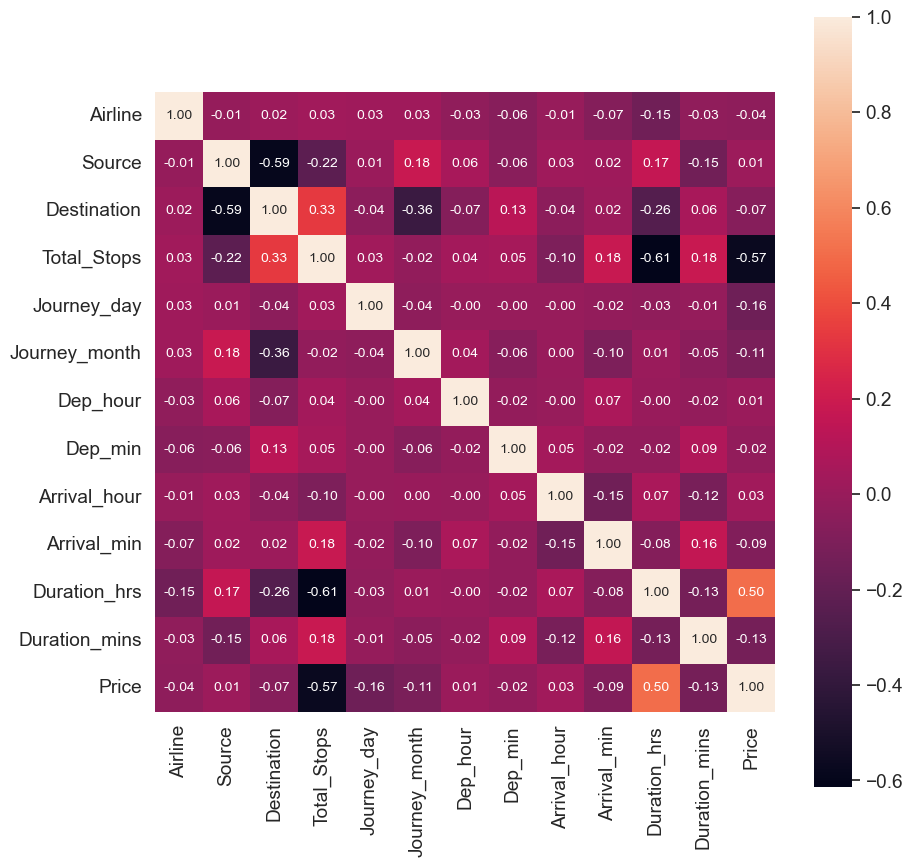

In [50]:
 
#CHECK CORREALTATION :
cor = df2.corr()

 # correatiion matrix 
sns.set(font_scale=1.25)
plt.figure(figsize=(10,10))
sns.heatmap(cor, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.show()


In [52]:
#Sepearate depdent and indepedent features 
X=df.drop('Price',axis=1) # indepdent features
y=df['Price']  # Dependent features.
X.shape #10462 rows and 12 columns 


(10462, 12)

## -Feature selection :

In [58]:
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest, f_regression

In [69]:
df2.dtypes

Airline          int32
Source           int32
Destination      int32
Total_Stops      int32
Journey_day      int32
Journey_month    int32
Dep_hour         int32
Dep_min          int32
Arrival_hour     int32
Arrival_min      int32
Duration_hrs     int32
Duration_mins    int32
Price            int32
dtype: object

#### split the data :

In [67]:
# Step 2: Split the dataset into training and testing sets using the selected features
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=40)


In [ ]:
## Scaling -Using Standard Scaler 

In [68]:
#Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


ValueError: could not convert string to float: 'Vistara'

https://github.com/Aman-Preet-Singh-Gulati/flight-fare-prediction/blob/main/Flight%20Fare%20Prediction%20blog.ipynb

https://github.com/Mandal-21/Flight-Price-Prediction/blob/master/flight_price.ipynb

https://github.com/Prajwal10031999/Flight-Fare-Prediction-ML-Web-App-With-Deployment/blob/main/flight_price.ipynb

https://github.com/IqraMahmood/Flight-Fare-Prediction/blob/main/Flight%20Fare%20Prediction%20Code.ipynb
